# Proyecto Final PDS
## Juan Camilo Chaparro Castellanos
### CC 1039466438

## En este proyecto se pretende filtrar una señal de audio sobre un instrumento musical utilizando diferentes filtros digitales para poder analizar la señal original vs la señal filtrada, poder analizar cambios en el dominio del tiempo y en el dominio de la frecuencia de la señal filtrada y analizar los diferentes comportamientos de la siguiente manera: 

1. Buscar una señal de audio de un instrumento musical
2. Hacer un análisis en frecuencia (FFT, espectrograma) que muestre los rangos de frecuencias en los que se distribuye la señal
3. Realizar los cálculos teóricos del diseño de los filtros (apoyarse en Python para el cálculo de los coeficientes del filtro). Utilizar diferentes filtros (mínimo 3) para que obtengan diferentes tonos de la señal de audio
4. Comparar la señal original y la señal filtrada y observar sus diferencias (visualmente y mediante la correlación)
5. Realizar el filtrado usando las funciones ya definidas en Python (esto lo verán en el último laboratorio)
6. Comparar el diseño teórico y el diseño con las funciones en Python de los diferentes filtros (Utilizar la correlación para comparar las señales).
7. La sustentación se hará en la semana de habilitaciones (11 al 14 de junio). Ya les enviaré los respectivos días y horarios para cada grupo. Si algún grupo quiere sustentar antes, me lo hacen saber para coordinar el espacio.

In [279]:
#librerias a utilizar

from matplotlib.pylab import *
import scipy.signal as signal
get_ipython().run_line_magic('matplotlib', 'inline')
import math #Librería matemática  
import numpy as np #Librería matemática y de vectores y matrices
import scipy.signal as sp #Librería para procesamiento de señales 
import matplotlib.pyplot as plt #Para graficar
import pandas as pd
import scipy.io.wavfile as waves #Para cargar los audios en formato wav 
from IPython.display import Audio #Para escuchar los audios
from scipy.io.wavfile import read, write #funciones para leer y escribir audio
from scipy.io.wavfile import read
from IPython.display import Audio
%matplotlib inline

### A continuacion realizaremos la carga de audio y el debido proceso para graficarlo y escucharlo

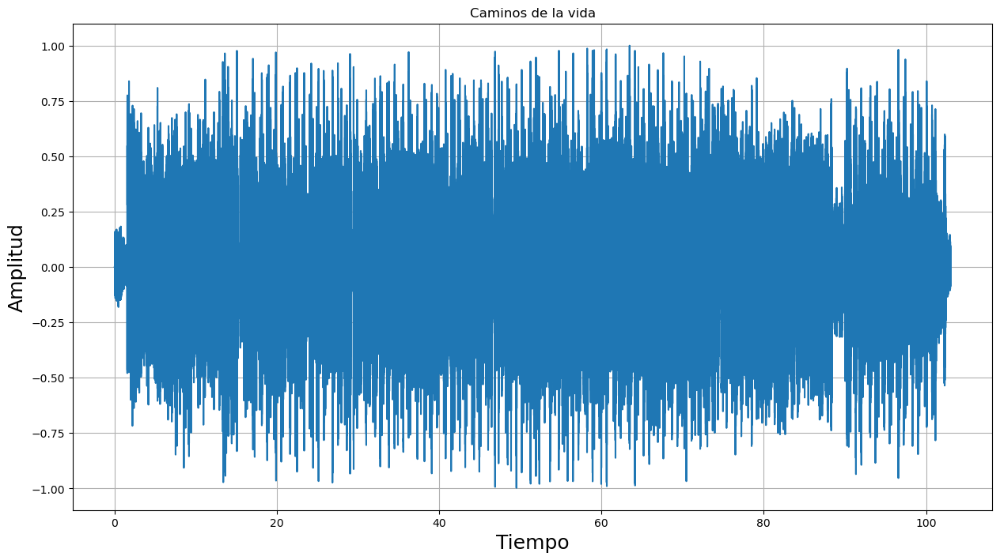

In [280]:
# Cargar el archivo de audio
fs, x = read('audio.wav')  # Carga del audio descargado.

# Verificar y manejar si los datos son estéreo (2 canales)
  #En caso de ser estereo, trabajarlo como (mono)
if len(x.shape) > 1:
    x = x[:, 0]  # Usar solo el primer canal si el audio es estéreo
    
# Normalizar la señal
 #Se normaliza la señal para evitar la saturacion, trabajar sobre un rango especifico, facilitar el analisis
x = x / float(np.max(np.abs(x))) 
# Eliminar nivel DC
 #Centrar la señal en el eje cero, elimina distorciones(zumbidos, estatica) no deseadas y para la T. de F. 
nivel_DC = np.mean(x)
x -= nivel_DC

# Crear el vector de tiempo
 #para mapear el tiempo del audio para su postumo analisis
t = np.arange(0, float(len(x)) / fs, 1.0 / fs)  

# Gráfica de la señal
plt.figure(figsize=(15, 8))
plt.plot(t, x)
plt.grid()
plt.title('Caminos de la vida')
plt.ylabel('Amplitud', fontsize=18)
plt.xlabel('Tiempo', fontsize=18)
plt.show()

# Reproducir el audio
 #Widget de Notebook para reproducir del audio
display(Audio(x, rate=fs))


#### para poder realizar el analisis del audio y su filtrado se tiene una gran limitacion que es el espacio de memoria del ordenador por lo que es necesario solo utilizar una fraccion del audio, para ello seleccionamos un tramos de 15 segundos como se muestra a continuacion

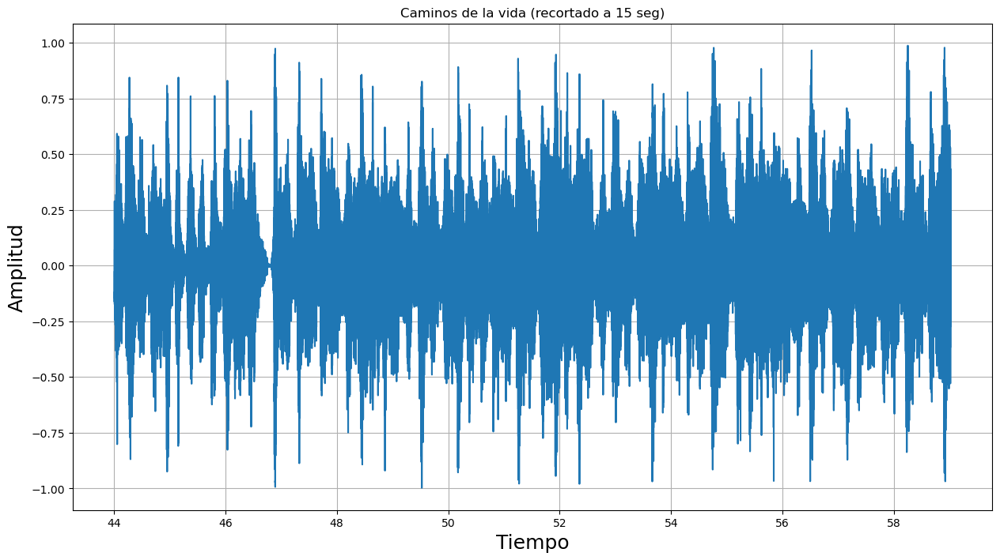

In [281]:
# Duración total del audio en segundos
duracion_total = len(x) / fs

# Duración del segmento a recortar (15 segundos)
duracion_segmento = 15

# Número de muestras para el segmento de 15 segundos
muestras_segmento = int(duracion_segmento * fs)

# Inicio del segmento (en muestras)
inicio = int((duracion_total - duracion_segmento) / 2 * fs)

# Final del segmento (en muestras)
fin = inicio + muestras_segmento

# Segmento de audio recortado
audio_recortado = x[inicio:fin]

# Gráfica de la señal recortada
plt.figure(figsize=(15, 8))
plt.plot(t[inicio:fin], audio_recortado)
plt.grid()
plt.title('Caminos de la vida (recortado a 15 seg)')
plt.ylabel('Amplitud', fontsize=18)
plt.xlabel('Tiempo', fontsize=18)
plt.show()

# Reproducir el audio recortado
display(Audio(audio_recortado, rate=fs))

### Realizamos el respectivo analisis en frecuencia (FFT y Espectograma)

Se realiza el analisis de la transformada reapida de fourier (FFT), el cual es un algoritmo de calculo de la transformada discreta de fourier que elimina los calculos repetitivos y permite mayor precision disminuyendo los errores de redondeo y se expresa de la siguiente manera: 

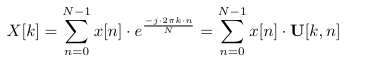

Donde U ∈ R^(N×K) representa una matriz de transformacion, Donde N es el nuumero de muestras de la señnal, y NFFT es el numero de puntos de la Transformada de Fourier que se desea calcular

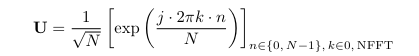

Dicho numero de puntos define la resolucion en frecuencia, donde cada uno mapea el contenido de frecuencia de la señal en un rango normalizado entre 0 y 2*pi*rad/seg, por lo que definimos dicha matriz de mapeo de la siguiente manera: 


In [282]:
def dftmatrix(N, Nfft):
    #construct DFT matrix
    k= np.arange(Nfft)
    if N is None: N = Nfft
    n = np.arange(N)
    U = np.matrix(np.exp(1j* 2*np.pi/Nfft *k*n[:,None]))
    return U/np.sqrt(Nfft)

y posteriormente se realiza la multiplicacion de la matriz con la señal, para poder realizar la operacion las muestras de l audio se deben reorganizar como una columna (un vector de una dimension): 

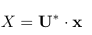

#### como se anuncio anteriormente por limitacion de memoria para el analisis, se toma solo 512 puntos para definir la resolucion en frecuencia de la señal

In [283]:
nfft=512 #puntos de resolucion
audio_recortado.shape=(len(audio_recortado),1) # Convierto en vector columna la señal
U=dftmatrix(len(audio_recortado), nfft) #matriz de transformacion
Xf=U.H*audio_recortado[:] # calculo la fft
t = np.arange(0, float(len(audio_recortado)) / fs, 1.0 / fs)  
freq=np.hstack((np.arange(0, nfft/2-1), np.arange(-nfft/2, 1)))*fs/nfft # vector de frecuencias


frecuencia de muestreo:  44100 Hz
numero de muestras:  661500


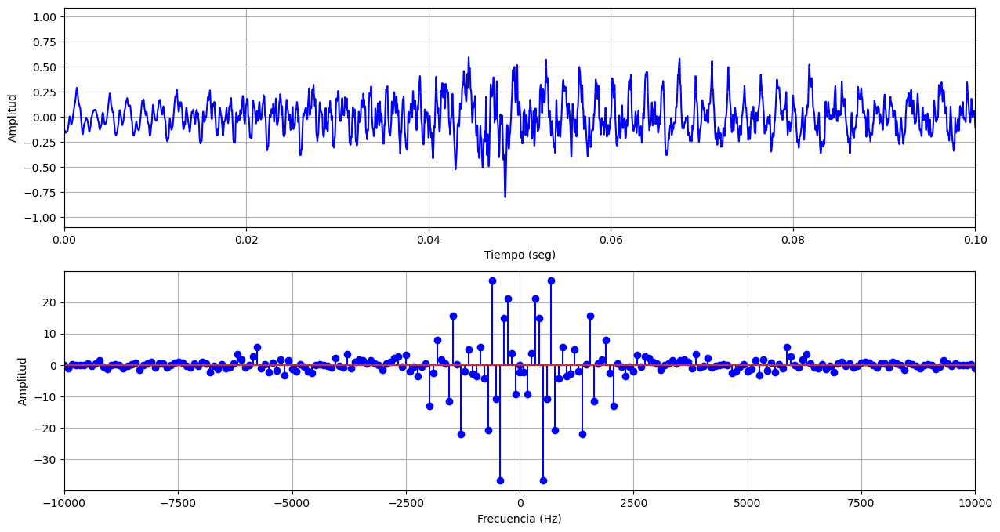

In [328]:
plt.figure(figsize=(15,8))
plt.subplot(211)
plt.plot(t, audio_recortado,'b')
plt.xlim(0,0.1) 
plt.ylabel('Amplitud')
plt.xlabel('Tiempo (seg)')
plt.grid()
plt.subplot(212)
plt.stem(freq, Xf,'b')
plt.ylabel('Amplitud')
plt.xlabel('Frecuencia (Hz)')
plt.xlim(-10000,10000)
plt.grid()



#data
print ('frecuencia de muestreo: ',fs,'Hz')
print('numero de muestras: ',len(audio_recortado))

#### * Se observa que al graficar el espectro de las señal estas presentan una componente real y otra imaginaria

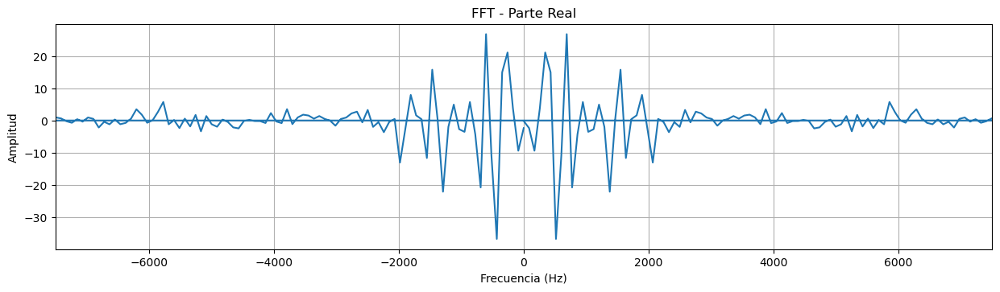

In [62]:
plt.figure(figsize=(15,8))
# Graficar la parte real
plt.subplot(2, 1, 1)
plt.plot(freq, np.real(Xf))
plt.title('FFT - Parte Real')
plt.xlabel('Frecuencia (Hz)')
plt.ylabel('Amplitud')
plt.xlim(-7500,7500)
plt.grid()

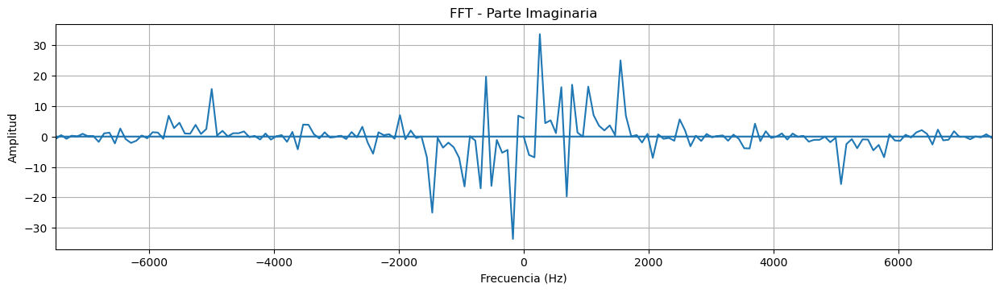

In [63]:
plt.figure(figsize=(15,8))
# Graficar la parte imaginaria
plt.subplot(2, 1, 2)
plt.plot(freq, np.imag(Xf))
plt.title('FFT - Parte Imaginaria')
plt.xlabel('Frecuencia (Hz)')
plt.ylabel('Amplitud')
plt.xlim(-7500,7500)
plt.grid()

#### * La parte real posee un comportamiento de simetria par respector al eje vertical
#### * En la grafica de la parte imaginaria muestra como las diferentes frecuencias contribuyen con la fase de la señal 
#### * Esta grafica muestra que el rango de las frecuencias del audio se encuentran alrrededor de las 7.5Khz
#### * señal simetrica, y por tener valores negativos es no causal

# Diseño de Filtros (teoricos)

# si fs = 44100, entonces la fmax debe ser 22500 khz por lo que la fc de corte debe ser menor a este valor para filtrar algo ripple es el valor maximo que puedo tolerar entre la banda pasante y atenuada el ancho de banda debe ser pequeño, ya que pueden pasar muchas frecuencias que no se quieren o no se nesesitan 


Para el desarrollo del enventanado tomamos como referencia la siguiente tabla :  que se tiene a continuacion : 
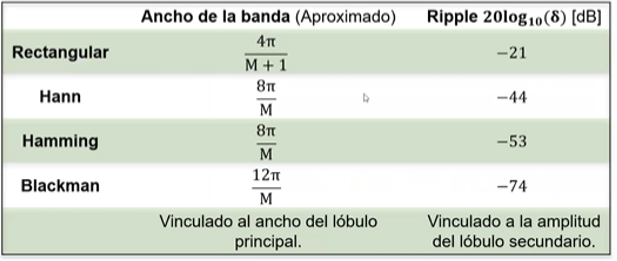
<center> Figura #1, tabla de ventanas </center>

## * 1er Filtro

Se diseña de un **Filtro Pasa-Bajos**  por medio de la tecnica del enventanado teniendo en cuenta las siguientes caracteristicas: 
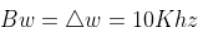
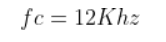


por lo que realizamos el siguiente analisis : 
Se tiene que el ripple esta representado con el simbolo delta 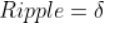 y expresado en porcentaje por lo que tiene que su valor es 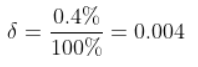  y debemos hallar su valor expresado en dB
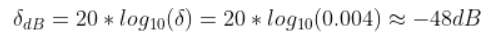
Luego comparamos el valor hallado con la tabla de valores de la **Figura #1** y de esta manera seleccionamos cual es la tecnica de enventanado mas propicio para filtrar la señal; realizando la comparacion se obtiene que solo podemos aplicar 2 enventanados (Hamming y BlackMan) por lo que realizamos el analisis para seleccionar cual es la mejor opcion de la siguiente manera : 
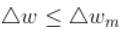
Hamming :
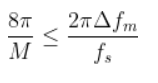
por lo que se obtiene que el orden del filtro es el siguiente:
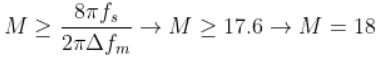, pero para que el filtro pueda tener fase lineal al generarlo de forma causal y simetria par es necesario que : 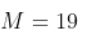
mientras que con BlackMan: 
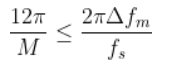
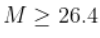
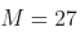

Por consiguiente se toma en consideracion la ventana Hamming ya que al ser de menor orden el filtro, por optimizacion de recursos de memoria del ordenador

se procede a normalizar la frecuencia de corte y la frecuencia angular
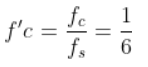
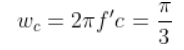

procedemos a utilizar las ecuaciones que representan la respuesta al impulso de un filtro pasa bajas y el enventanado Hamming respectivamente
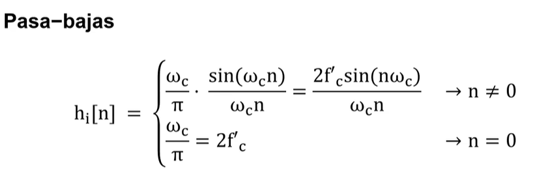
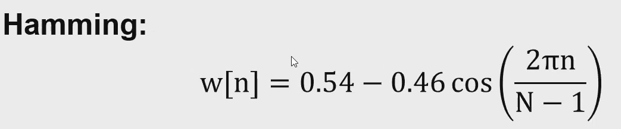
procedemos a realizar las operaciones matematicas para hallar los coeficientes del filtro

In [316]:
#Valores que definen el filtro
BW = 10000.0 #ancho de banda
bwn=2*np.pi*(BW/fs) #ancho de banda normalizada
fc= 12000.0 #frecuencia de corte
fc_norm= fc/ fs # frecuencia de corte normalizada
wc = 2*np.pi*(fc/fs) # frecuencia angular normalizada
delta = 0.004 #ripple
delta_dB = -48 #ripple en dB
M = 19 #orden del filtro

n_int = np.arange(-M // 2 + 1, M // 2 + 1)

# Generamos la ecuación del filtro
hi_n = 2 * fc_norm * (sin(wc * n_int) / (wc * n_int))
hi_n[n==0] = 2 * fc_norm


# Generamos la ecuacion del enventanado
wn = np.array([0.54 - 0.46 * np.cos(2 * np.pi * n / (M - 1)) for n in range(M)])


#filtro final enventanado
H_n = hi_n * wn

C:\Users\Usuario\AppData\Local\Temp\ipykernel_13912\130624749.py:14: RuntimeWarning: invalid value encountered in divide
  hi_n = 2 * fc_norm * (sin(wc * n_int) / (wc * n_int))


#### A conitnuacion imprimimos todos los vectores 

In [317]:
print("el vector de orden de las muestras n= ", n_int)

el vector de orden de las muestras n=  [-9 -8 -7 -6 -5 -4 -3 -2 -1  0  1  2  3  4  5  6  7  8  9]


In [318]:
print("evaluando la ecuacion del filtro pasa bajas en n es igual a \n hi[n] =",hi_n)

evaluando la ecuacion del filtro pasa bajas en n es igual a 
 hi[n] = [ 0.01114467  0.03566189 -0.02561576 -0.03927297  0.04891335  0.04197716
 -0.09702219 -0.04365103  0.31524359  0.54421769  0.31524359 -0.04365103
 -0.09702219  0.04197716  0.04891335 -0.03927297 -0.02561576  0.03566189
  0.01114467]


In [319]:
print("el vector del enventanado de hamming es: \n W[n]= ",wn)

el vector del enventanado de hamming es: 
 W[n]=  [0.08       0.10774139 0.18761956 0.31       0.46012184 0.61987816
 0.77       0.89238044 0.97225861 1.         0.97225861 0.89238044
 0.77       0.61987816 0.46012184 0.31       0.18761956 0.10774139
 0.08      ]


In [320]:
print("los coeficientes del filtro utilizando la tecnica del enventanado son : \n \n h[n] = ",H_n)

los coeficientes del filtro utilizando la tecnica del enventanado son : 
 
 h[n] =  [ 0.00089157  0.00384226 -0.00480602 -0.01217462  0.0225061   0.02602073
 -0.07470709 -0.03895333  0.3064983   0.54421769  0.3064983  -0.03895333
 -0.07470709  0.02602073  0.0225061  -0.01217462 -0.00480602  0.00384226
  0.00089157]


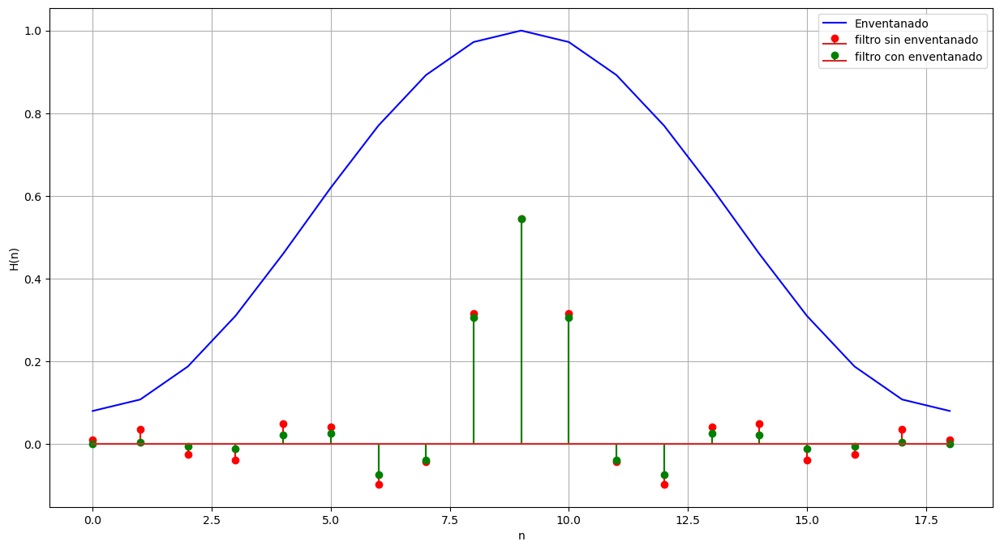

In [321]:
# Grafica
plt.figure(figsize=(15,8))
plt.stem(hi_n,'r',label ='filtro sin enventanado')
plt.plot(wn,'b',label ='Enventanado')
plt.stem(H_n,'g',label='filtro con enventanado')
plt.ylabel('H(n)')
plt.xlabel('n')
plt.legend()
plt.grid()
plt.show()

#### procedemos a realizar el filtrar la señal de audio

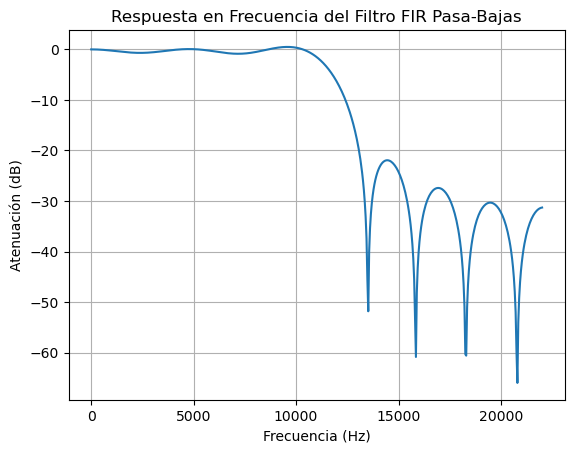

In [322]:
# Diseño del filtro
taps = firwin(M, fc / nyq_rate, window='hamming', width=bwn/fs)

# Aplicar el filtro a la señal (audio_recortado debe ser tu señal de entrada)
filtered_x = lfilter(taps, 1.0, audio_recortado)

# Respuesta en frecuencia del filtro
w, h = freqz(taps, worN=nfft) 

# Gráfica
plt.figure()
plt.plot(0.5 * fs * w / np.pi, 20 * np.log10(np.abs(h)))
plt.title("Respuesta en Frecuencia del Filtro FIR Pasa-Bajas")
plt.xlabel("Frecuencia (Hz)")
plt.ylabel("Atenuación (dB)")
plt.grid()
plt.show()

In [323]:
!pip install soundfile
import soundfile as sf

# Normalizar los datos del audio
filtered_x = filtered_x / np.max(np.abs(filtered_x))

# Guardar el archivo de audio filtrado
output_filename = 'audio_filtrado.wav'
sf.write(output_filename, filtered_x, fs)

# Reproducir el archivo de audio filtrado
display(Audio(output_filename))

## * 2do filtro

En este caso realizamos un **Filtro Pasa bandas** con las siguientes especificaciones :
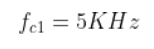
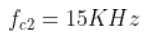
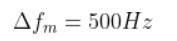
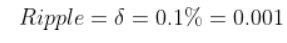

Realizamos los respectivos calculos: 
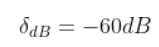
Utilizando la tabla de la **Figura #1** seleccionamos el enventanado **BlackMan** ya que es el unico que acepta los parametros dados
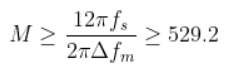
por lo que : 
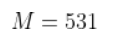
tenemos que: 
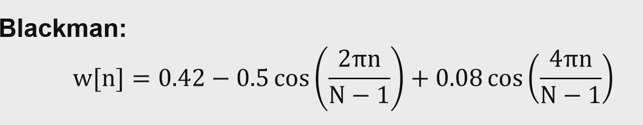
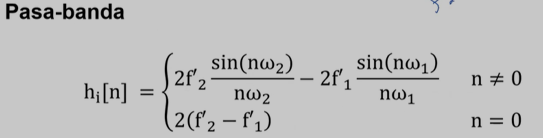

procedemos a realizar la normalizacion de las frecuencias de corte y analisis con las ecuaciones 

## * 3er filtro

## Comparacion ( S.original vs S.filtrada)

## * 1er Filtro

para detallar de mejor manera el cambio de los valores realizamos la correlacion entre la señal original vs la señal filtrada de la siguiente manera: 

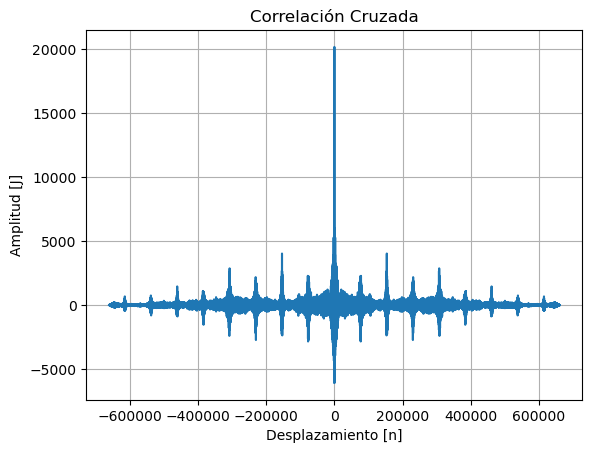

In [325]:
# Asegurarse de que ambos arrays sean unidimensionales
audio_recortado = audio_recortado.flatten()
filtered_x = filtered_x.flatten()

# Realizar la correlación cruzada
Rxx = np.correlate(audio_recortado, filtered_x, mode='full')
tau = np.arange(-len(audio_recortado)+1, len(audio_recortado), 1)

# Graficar la correlación
plt.plot(tau, Rxx)
plt.title("Correlación Cruzada")
plt.xlabel("Desplazamiento [n]")
plt.ylabel("Amplitud [J]")
plt.grid()
plt.show()

## * 2do Filtro

## * 3er Filtro

## Uso de funciones y filtros predefinidas en Python

## * 1er Filtro

## 2do Filtro

## * 3er Filtro

## Analisis ( Diseño Teorico vs D. python ) los diferentes filtros (Utilizar la correlación para comparar las señales).

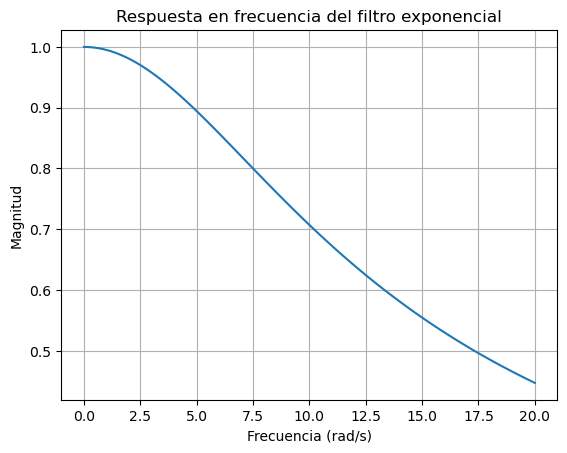

In [2]:
def H(w):
  return 1 / (1 + 1j * w / 10)

import numpy as np
import matplotlib.pyplot as plt

w = np.linspace(0, 20, 100)
mag_H = np.abs(H(w))

plt.plot(w, mag_H)
plt.xlabel('Frecuencia (rad/s)')
plt.ylabel('Magnitud')
plt.title('Respuesta en frecuencia del filtro exponencial')
plt.grid()
plt.show()


C:\Users\Usuario\AppData\Local\Temp\ipykernel_13912\4217814087.py:18: ComplexWarning: Casting complex values to real discards the imaginary part
  H[i] = np.sum(a * np.exp(-1j * i * np.pi * np.arange(1, len(a) + 1) / 10)) / np.sum(b * np.exp(-1j * i * np.pi * np.arange(1, len(b) + 1) / 10))


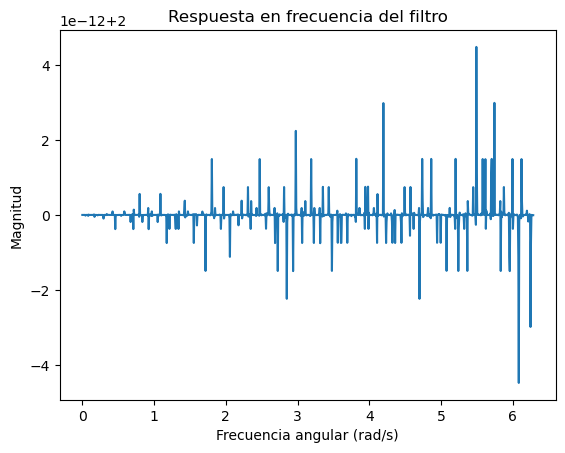

In [3]:
import numpy as np

def respuesta_frecuencia_filtro(w, a, b):
  """
  Calcula la respuesta en frecuencia de un filtro con comportamiento Euler y aplanado en n = 10.

  Parámetros:
    w: Vector de frecuencias angulares.
    a: Coeficientes del numerador del filtro.
    b: Coeficientes del denominador del filtro.

  Devuelve:
    H: Respuesta en frecuencia del filtro.
  """

  H = np.zeros_like(w)
  for i in range(len(w)):
    H[i] = np.sum(a * np.exp(-1j * i * np.pi * np.arange(1, len(a) + 1) / 10)) / np.sum(b * np.exp(-1j * i * np.pi * np.arange(1, len(b) + 1) / 10))
  return H

# Ejemplo de uso

w = np.linspace(0, 2 * np.pi, 1000)
a = np.array([1, 2, 3])
b = np.array([1, 1, 1])

H = respuesta_frecuencia_filtro(w, a, b)

# Gráfica de la respuesta en frecuencia

import matplotlib.pyplot as plt

plt.plot(w, np.abs(H))
plt.xlabel('Frecuencia angular (rad/s)')
plt.ylabel('Magnitud')
plt.title('Respuesta en frecuencia del filtro')
plt.show()
